# Selecting C-type asteroids from the Gaia DR3 reflectance spectra with machine learning

Reproduce the initial classification by Joost Barendse of C-type vs non-C-type asteroid using ML algorithms.

The Gaia DR3 data was simply downloaded in full with the query:
```sql
select * from gaiadr3.sso_reflectance_spectrum
```
The reflectance spectra are corrected according to the prescriptions by [Tinaut-Ruano et al. (2023)](https://ui.adsabs.harvard.edu/abs/2023A%26A...669L..14T/abstract). The factors by which to multiply the `reflectance_spectrum` column are listed in their table 1.

| Wavelength (nm) | Correction Factor |
| -- | -- |
| 374.0 | 1.07 |
| 418.0 | 1.05 |
| 462.0 | 1.02 |
| 506.0 | 1.01 |

Additional data on the asteroids, their proper orbital elements, inverse diameters and magnitudes $H$, were downloaded from the [MP3C](https://mp3c.oca.eu/) database (on November 18 2023). An unconstrained "best values" search was done to get all data. These data are added to the table created with `create_sso_objects_file.py`. This was done by merging the tables in [topcat](https://www.star.bris.ac.uk/~mbt/topcat/) using the exact match on MPC numbers.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from astropy.visualization import HistEqStretch, ImageNormalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegressionCV
from astropy.table import Table

from sklearn.metrics import silhouette_samples, silhouette_score, completeness_score, homogeneity_score
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, make_scorer
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from numpy import genfromtxt

from scipy.stats import lognorm

from tqdm import tqdm

import umap

from agabpylib.plotting.plotstyles import useagab, apply_tufte
from agabpylib.stats.robuststats import rse
from reflspectratools import (
    plot_spectra_collection,
    load_dr3_data,
    create_ml_training_classes,
    extract_spectra,
    prep_classifier_inputs,
)

useagab(fontsize=22, linewidths=3, axislinewidths=2)
from scipy.stats import linregress

## Read in the data
Read the Gaia DR3 data and the classified asteroid MPC numbers for use in ML classification training and application.

__NOTE__ that for the initial seperation of C-types from the rest of the asteroids the full range of wavelengths should be used for the spectra. That this is the case can be checked by re-running with `ssodata = load_dr3_data(clipspectra=True)`.

In [2]:
ssospectra = load_dr3_data(clipspectra=False)    #Corrected with correction factors
n_asteroids = ssospectra.number_mp.unique().size
wavelengths = ssospectra["wavelength"].unique()
wavelengths.sort()
ssotypes = create_ml_training_classes(ssospectra, filter=True)

ssoparams = Table.read(".\data\DR3ReflectanceSpectra.fits.gz").to_pandas()
#ssoparams["denomination"] = ssoparams.denomination.str.decode("utf-8")
#ssoparams["parent_name"] = ssoparams.parent_name.str.decode("utf-8")

In [3]:
b = ssospectra.reflectance_spectrum_normalized.isnull()
wavelengths = ssospectra[b].wavelength.unique()

In [4]:
def distribution_function(data, wavelength):
    copied = data.copy()
    
    dropped_na = data.reflectance_spectrum[data.wavelength == wavelength].dropna()
    spectra_reflectance = dropped_na.values    #Dropping all the NaN values in the data
    
    if wavelength == 374: 
        spectra_reflectance = [i for i in spectra_reflectance if i <= 2.5]     #Only selecting data that is pretty
    elif wavelength == 946:
        spectra_reflectance = [i for i in spectra_reflectance if i <= 1.65 and i >= 0.75]
    elif wavelength == 990:
        spectra_reflectance = [i for i in spectra_reflectance if i <= 2 and i >= 0.6]
    elif wavelength == 1034:
        spectra_reflectance = [i for i in spectra_reflectance if i <= 3 and i >= 0.6]
    
    shape, loc, scale = lognorm.fit(spectra_reflectance, floc = 0)         #Fitting the data to a log normal distribution
    
    NaN_data = data.reflectance_spectrum[data.wavelength == wavelength].isnull()
    NaN_values = len(data.reflectance_spectrum[data.wavelength == wavelength][NaN_data])    #Finding how many NaN values there are
    print(f'Wavelength {wavelength} has {NaN_values} NaN values')         #Number of NaN values per wavelength
    
    new_values = iter(np.float32(lognorm.rvs(shape, loc, scale, size=NaN_values)))
    copied.reflectance_spectrum[data.wavelength == wavelength] = data.reflectance_spectrum[data.wavelength == wavelength].apply(lambda x: next(new_values) if pd.isna(x) else x)  
   
    #x = np.linspace(min(spectra_reflectance), max(spectra_reflectance), 1000)
    #pdf = lognorm.pdf(x, shape, loc, scale)
    #plt.hist(spectra_reflectance, density=True, alpha=0.5)
    #plt.plot(x, pdf, 'r-', lw=2, label="Lognormal Fit")
    #plt.show()
    
    return copied

In [5]:
wl_946 = distribution_function(ssospectra, 946)
wl_990 = distribution_function(wl_946, 990)

Wavelength 946 has 1 NaN values


<ipython-input-4-a30fcd4497d0>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copied.reflectance_spectrum[data.wavelength == wavelength] = data.reflectance_spectrum[data.wavelength == wavelength].apply(lambda x: next(new_values) if pd.isna(x) else x)


Wavelength 990 has 1 NaN values


<ipython-input-4-a30fcd4497d0>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copied.reflectance_spectrum[data.wavelength == wavelength] = data.reflectance_spectrum[data.wavelength == wavelength].apply(lambda x: next(new_values) if pd.isna(x) else x)


There are 4 wavelengths where we NaN values. We will delete all rows with these wavelengths for now

In [6]:
new_spectra = wl_990.copy()
new_spectra = new_spectra.drop(new_spectra[new_spectra.wavelength == 374].index)
new_spectra = new_spectra.drop(new_spectra[new_spectra.wavelength == 1034].index)
new_spectra = new_spectra.drop(new_spectra[new_spectra.wavelength == 550].index)

We now split the data so we can use the data for clustering purposes

In [7]:
training_spectra, training_labels, data_to_be_classified = prep_classifier_inputs(
    new_spectra, ssotypes
)

The next cell will reduce the dimension of the data to a 2 dimensional vector (instead of 12 dimensional). This way we can get a view of the connectedness of certain points

In [8]:
reducer = umap.UMAP(random_state = 42, n_neighbors=5, min_dist=0)
embedding = reducer.fit_transform(data_to_be_classified)
embedding.shape

c:\Users\rikal\anaconda3\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


(60518, 2)

In [83]:
reducer2 = umap.UMAP(n_neighbors=200, min_dist = 0.0, random_state = 42)#  
embedding2 = reducer2.fit_transform(data_to_be_classified)
embedding2.shape

c:\Users\rikal\anaconda3\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


We will now plot the UMAP reduced dimension data. We will plot all the data, the ones we know are C_type, rest and other.

<Figure size 1440x288 with 0 Axes>

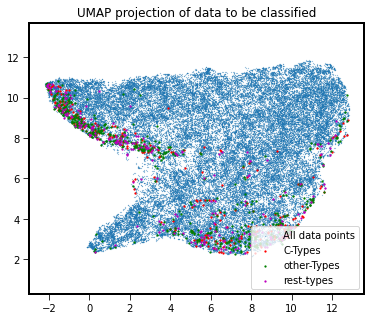

In [12]:
sso_types_list = list(ssotypes.values()) #Transforms the types type from dictionary to a list so we can use them more easily  
#objects = list(ssotypes.keys())     #Name of the objects in the dictionary

C_types = sso_types_list[0]
other = sso_types_list[1]
rest = sso_types_list[2]

plt.figure().set_figwidth(20)
plt.figure().set_figheight(5)
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s = 0.03, label = 'All data points')
plt.scatter(
    embedding[:, 0][C_types],
    embedding[:, 1][C_types], color = 'r', s = 1.5, label = 'C-Types')
plt.scatter(
    embedding[:, 0][other],
    embedding[:, 1][other], color = 'g', s = 1.5, label = 'other-Types')
plt.scatter(
    embedding[:, 0][rest],
    embedding[:, 1][rest], color = 'm', s = 1.5, label = 'rest-types')
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of data to be classified');
plt.legend(prop={'size': 10})
plt.show()

<Figure size 1440x288 with 0 Axes>

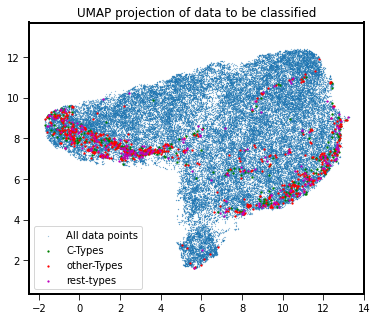

In [30]:
sso_types_list = list(ssotypes.values()) #Transforms the types type from dictionary to a list so we can use them more easily  
#objects = list(ssotypes.keys())     #Name of the objects in the dictionary

C_types = sso_types_list[0]
other = sso_types_list[1]
rest = sso_types_list[2]

plt.figure().set_figwidth(20)
plt.figure().set_figheight(5)
plt.scatter(
    embedding2[:, 0],
    embedding2[:, 1], s = 0.03, label = 'All data points')
plt.scatter(
    embedding2[:, 0][C_types],
    embedding2[:, 1][C_types], color = 'g', s = 1.5, label = 'C-Types')
plt.scatter(
    embedding2[:, 0][other],
    embedding2[:, 1][other], color = 'r', s = 1.5, label = 'other-Types')
plt.scatter(
    embedding2[:, 0][rest],
    embedding2[:, 1][rest], color = 'm', s = 1.5, label = 'rest-types')
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of data to be classified');
plt.legend(prop={'size': 10})
plt.show()

The already known data types seem not to be randomly distributed. Maybe we got a biased distribution of types. 

We can do the same as UMAP using the T-distributed stochastic neighbor embedding method. This produces a relatively similar image.

We will now implement the K-means usupervised clusering algorithm. For the algorithm to work, we need to specify the amount of clusters we think the data will have. We can determine this value by looking at a range of values and looking for the 'elbow point' wher the graph significantly reduces its slope

We see that the slope reduces significantly around k = 4, 5, 6. For now we will use k = 5 to fit all the data.

We now look at where the distribution of these clusters. We do this by looking at the UMAP and giving all the points in the same cluster the same colour.

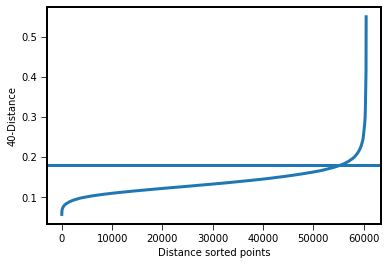

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1440x288 with 0 Axes>

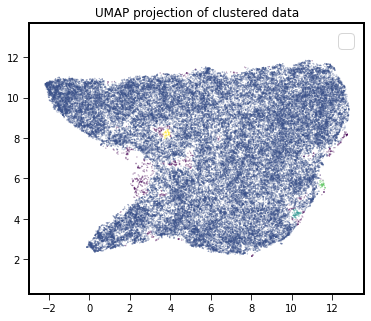

[-1  0  1  2  3] [  680 59671    72    47    48]


In [15]:
k = 40

# Compute k-nearest neighbors
# you need to add 1 to k as this function also return 
# distance to itself (first column is zero)
nbrs = NearestNeighbors(n_neighbors=k+1).fit(embedding)
#
## get distances
dist, ind = nbrs.kneighbors(embedding)
k_dist = np.sort(dist[:, -1])
plt.plot(k_dist)
plt.xlabel('Distance sorted points')
plt.ylabel(f'{k}-Distance')
plt.axhline(y = 0.18)
plt.show()

clustering = DBSCAN(eps = 0.18, min_samples=k).fit(embedding)
clusters = clustering.labels_

plt.figure().set_figwidth(20)
plt.figure().set_figheight(5)
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s = 0.03, c = clusters)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of clustered data')
plt.legend(prop={'size': 20})
plt.show()

unique, counts = np.unique(clusters, return_counts=True)
print(unique, counts)

#40, 0.15


In [ ]:
def dbscan_epsilon(data, num_clusters, min_epsilon, max_epsilon, number_of_interations):
    range_epsilon = np.arange(min_epsilon, max_epsilon, (max_epsilon-min_epsilon)/number_of_interations)
    silhouette_scores = np.array([])

    for epsilon in range_epsilon:
        clustering = DBSCAN(eps = epsilon, min_samples=num_clusters).fit(data)
        clusters = clustering.labels_

        silhouette_avg = silhouette_score(data, clusters)
        silhouette_scores = np.append(silhouette_scores, silhouette_avg)
    df = pd.DataFrame({'epsilon': range_epsilon, 'silhouette score': silhouette_scores})
    df.set_index('epsilon', inplace=True)
    return df


In [41]:
df_epsilon = dbscan_epsilon(embedding, 40, 0.1, 0.25, 30)


In [44]:
df_epsilon
df_epsilon.to_csv('epsilon_silhouette.csv', index = 'epsilon')

In [9]:
df_epsilon = pd.read_csv('epsilon_silhouette.csv', index_col = 'epsilon')

In [11]:
fraction_in_clusters = np.array([])
num_of_cluster = np.array([])

for epsilon in df_epsilon.index:
    clustering = DBSCAN(eps = epsilon, min_samples=40).fit(embedding)
    clusters = clustering.labels_
    unique, counts = np.unique(clusters, return_counts=True)
    counts = np.delete(counts, np.argmax(counts))
    fraction_in_clusters = np.append(fraction_in_clusters, np.sum(counts[1:])/60518)
    num_of_cluster = np.append(num_of_cluster, len(unique))


In [14]:
participation_score = fraction_in_clusters*num_of_cluster

In [15]:
participation_score

array([3.50255131e+01, 5.51259460e+01, 8.58338841e+01, 1.03054100e+02,
       1.15178426e+02, 9.51309693e+01, 6.07632440e+01, 4.99128854e+01,
       3.07195876e+01, 2.24899204e+01, 3.02843782e+00, 1.45622790e+00,
       9.35126739e-01, 6.99709177e-01, 8.90974586e-02, 5.71400245e-02,
       1.45411283e-02, 8.97253710e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00])

In [16]:
df_epsilon['Fraction in clusters'] = fraction_in_clusters
df_epsilon['Number of clusters'] = num_of_cluster
df_epsilon['Participation score'] = participation_score

In [17]:
df_epsilon

,silhouette score,Fraction in clusters,Number of clusters,Participation score
epsilon,,,,
0.100,-0.521590,0.235071,149.0,35.025513
0.105,-0.421691,0.320500,172.0,55.125946
0.110,-0.303001,0.418702,205.0,85.833884
0.115,-0.255794,0.512707,201.0,103.054100
0.120,-0.256144,0.599888,192.0,115.178426
0.125,-0.255762,0.617734,154.0,95.130969
0.130,-0.336522,0.626425,97.0,60.763244
0.135,-0.277642,0.639909,78.0,49.912885
0.140,-0.265594,0.639991,48.0,30.719588


In [18]:
clustering = DBSCAN(eps = 0.12, min_samples=40).fit(embedding)
clusters = clustering.labels_

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1440x288 with 0 Axes>

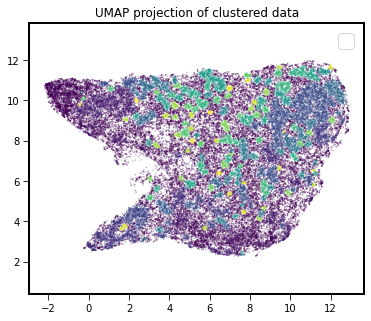

In [19]:
plt.figure().set_figwidth(20)
plt.figure().set_figheight(5)
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s = 0.03, c = clusters)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of clustered data')
plt.legend(prop={'size': 20})
plt.show()

We see that the K-means clustering method translates really well to the UMAP mapp. It clusters data that are also really close in the UMAP plot.

<ipython-input-21-133025ad8c7c>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(2 * 12, 2 * 8), tight_layout=True)


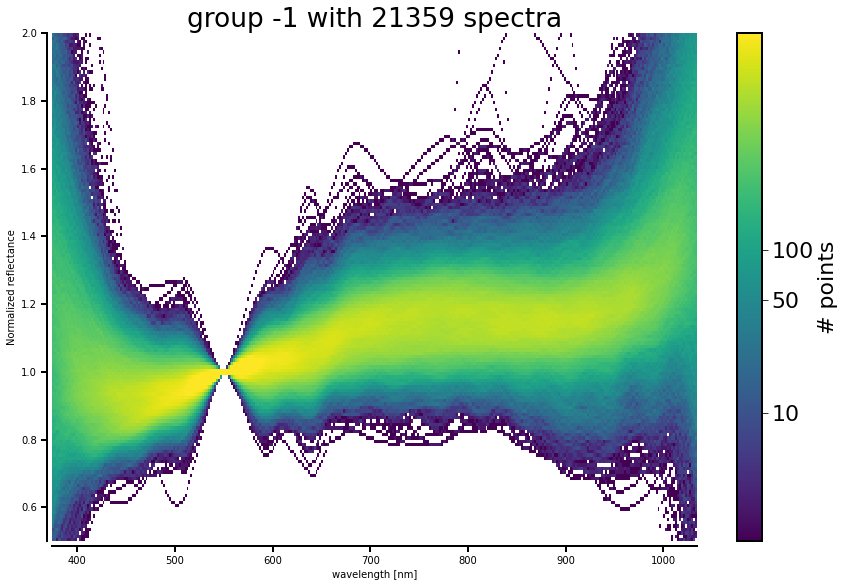

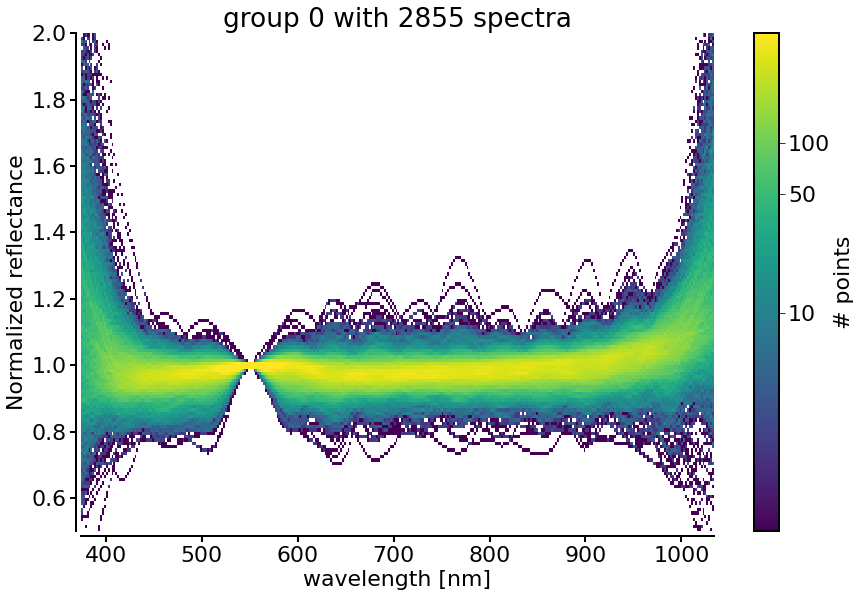

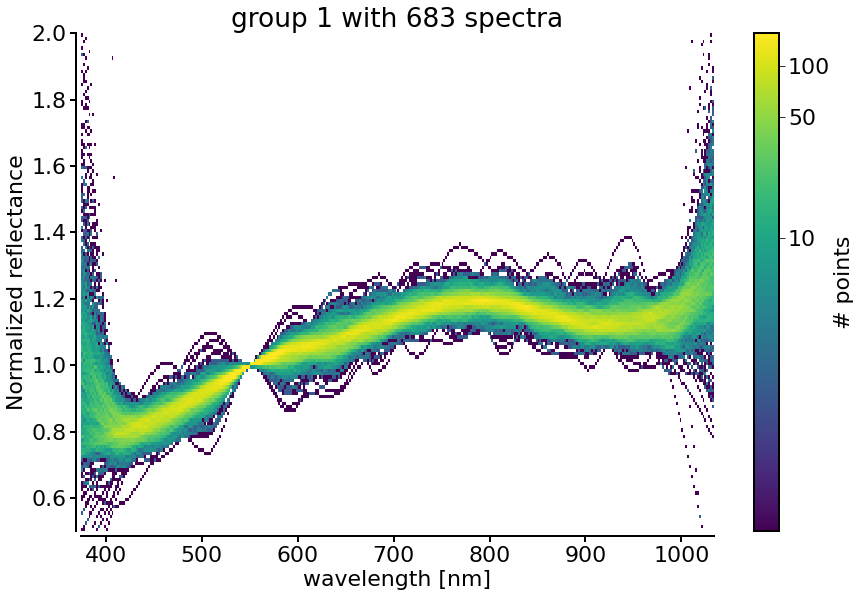

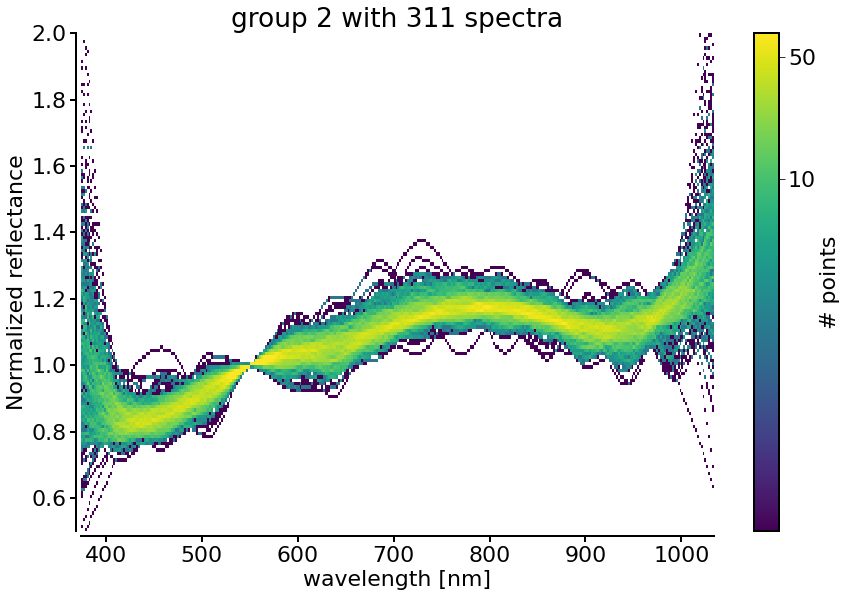

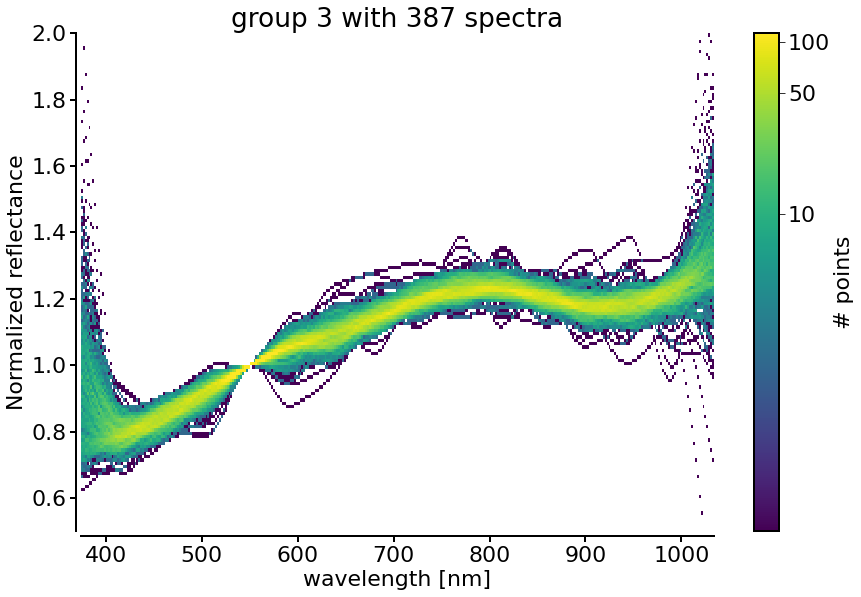

...

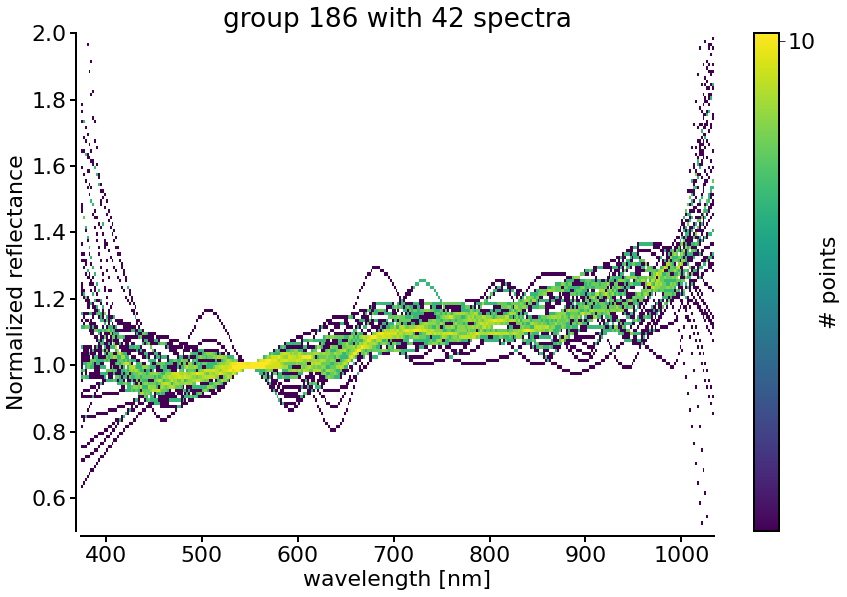

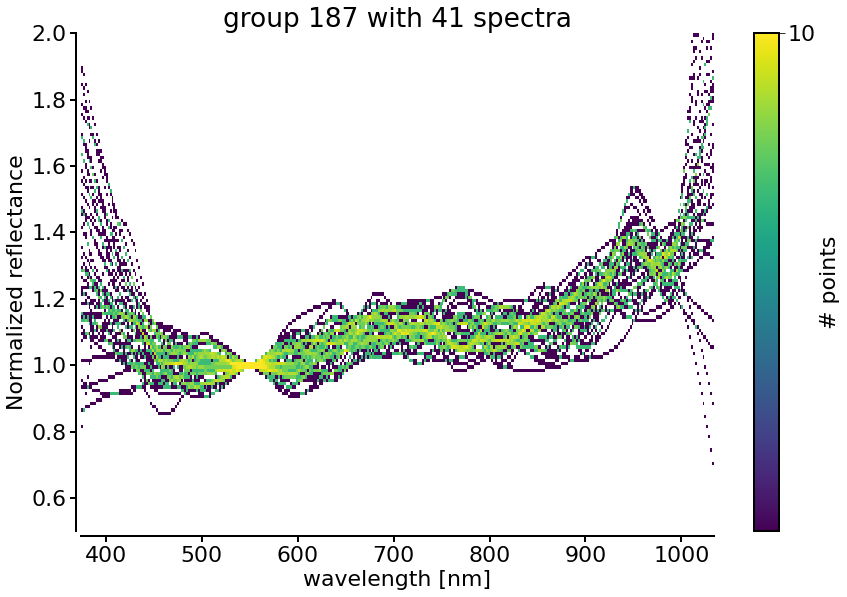

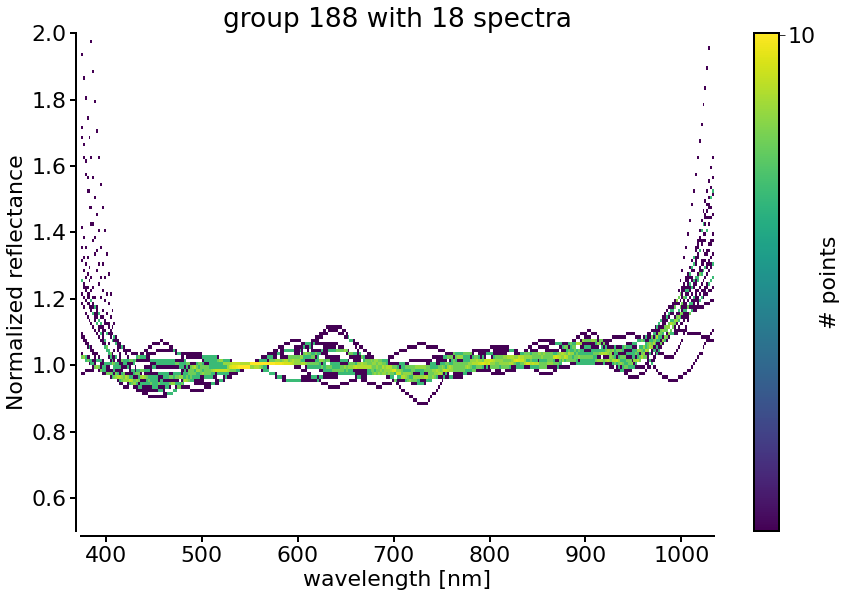

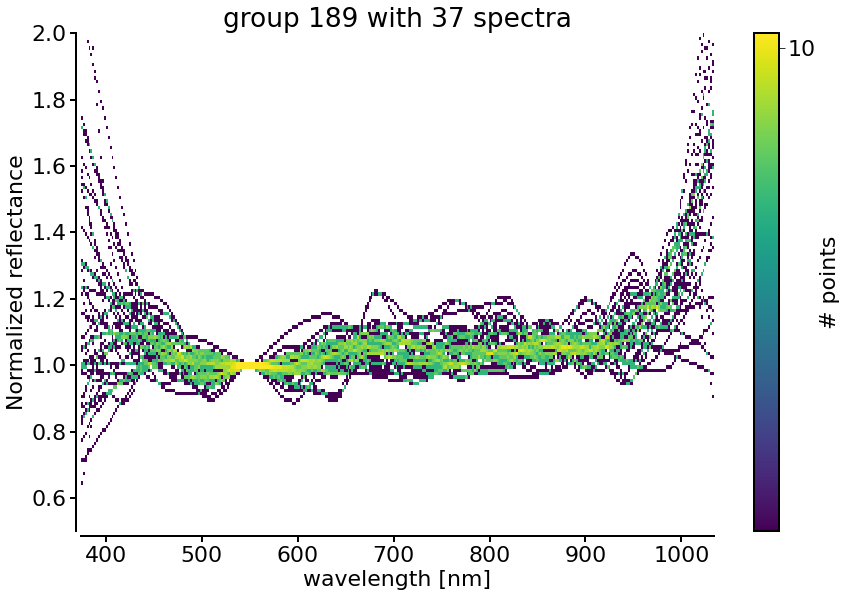

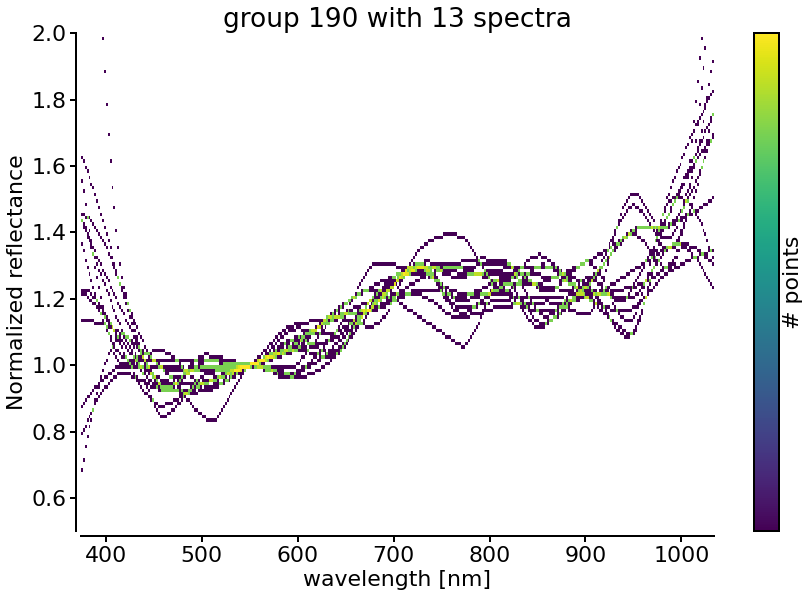

In [21]:
unique_labels = np.unique(clusters)
for n in unique_labels:
    i=1
    group = []
    non_group_indices = []
    while i <len(clusters)+1:
            if clusters[i-1] == n:
                index_ssospectra = (i*16)-1
                mp_number = ssospectra.number_mp[index_ssospectra]
                group.append(mp_number)
                i+=1
            else:
                index_ssospectra = (i*16)-1
                non_group_indices.append(i)
                i+=1



    fig = plt.figure(figsize=(2 * 12, 2 * 8), tight_layout=True)
    gs = GridSpec(2, 2, figure=fig)
    axspectra = []
    axspectra.append(fig.add_subplot(gs[0, 0]))
    for axx in axspectra:
        apply_tufte(axx)

    plt.rcParams.update({'font.size': 22})
    plot_spectra_collection(ssospectra, axspectra[0], fig, group, cbarticks=[10, 50, 100])
    plt.title(f'group {n} with {len(group)} spectra')
    
#a vervangen door labels